# Tinklo analizė

## Įtakingiausi autoriai pagal tyrimo sritis / temas

Įtakingiausi mokslininkai bus įvertinti, remiantis šiomis tinklo centrališkumo metrikomis:
- *degree* - vertina mokslininko populiarumą, remiantis su kiek skirtingų autorių konkretus mokslininkas dirbo.
- *betweenness* - mokslininkas, jungiantis skirtingas grupes, pvz. grupes, kurios specializuojasi skirtingose dirbtinio intelekto temose.
- *pagerank* - vertina mokslininko populiarumą (prestižą), remiantis su kiek daugausiai cituojamų autorių konkretus autorius bendradarbiavo.

Galutinis įtakos balas (angl. Influence Score) apskaičiuotas kaip šių trijų normalizuotų metrikų aritmetinis vidurkis.

Kadangi duomenų šaltinyje yra net **18591** mokslininkas, todėl pilno tinklo atvaizdavimas yra nepraktiškas. Norint sumažinti tinklo viršūnių kiekį, atvaizduosime tik viršūnes, kurios yra tiesiogiai sujungtos su įtakingiausiais mokslininkais.

In [47]:
suppressPackageStartupMessages({
  library(igraph)
  library(ggraph)
  library(ggplot2)
  library(tibble)
  library(dplyr)
  library(patchwork)
  library(knitr)
})

visualize_influencers <- function(file_path, citation_path = "./dataset/generated/author_citations.csv", top_k = 3, title = '') {
  
  set.seed(42)
  
  # --- 2. Duomenų nuskaitymas ---
  if (!file.exists(file_path)) {
    stop("Nurodytas failo kelias neegzistuoja.")
  }
  
  df_raw <- read.csv(file_path, check.names = FALSE)
  
  # --- 3. Grafo kūrimas ir supaprastinimas ---
  g <- graph_from_data_frame(df_raw, directed = FALSE)
  
  g <- simplify(
    g,
    remove.multiple = TRUE,
    remove.loops    = TRUE,
    edge.attr.comb  = "first"
  )
  
  # Pašaliname izoliuotas viršūnes (mazgus)
  g <- delete_vertices(g, V(g)[degree(g) == 0])

  # --- 4. Citavimo duomenų nuskaitymas ---
  citations_vec <- NULL
  if (file.exists(citation_path)) {
    df_cit <- read.csv(citation_path, check.names = FALSE, stringsAsFactors = FALSE)
    colnames(df_cit)[1:2] <- c("Author", "Citations")
    df_cit <- df_cit %>% 
      group_by(Author) %>% 
      summarize(Citations = max(Citations), .groups = 'drop')
    citations_vec <- setNames(df_cit$Citations, df_cit$Author)
  } else {
    warning(paste("Citavimo failas nerastas:", citation_path, "- Citavimų skaičius nustatytas į 0."))
  }
  
  # Priskiriame citavimus
  if (!is.null(citations_vec)) {
    V(g)$citations <- citations_vec[V(g)$name]
    V(g)$citations[is.na(V(g)$citations)] <- 0
  } else {
    V(g)$citations <- 0
  }
  
  # --- 5. Mazgų metrikos ir bendras balas ---
  V(g)$degree      <- degree(g)
  V(g)$betweenness <- betweenness(g, directed = FALSE, normalized = TRUE)
  
  # PageRank (Personalizuotas)
  pr_weights <- V(g)$citations + 1 
  V(g)$pagerank <- page_rank(g, directed = FALSE, personalized = pr_weights, weights=NULL)$vector
  
  V(g)$label <- V(g)$name
  
  # Normalizavimo funkcija
  normalize <- function(x) {
    if (max(x) == min(x)) return(rep(0, length(x))) 
    return ((x - min(x)) / (max(x) - min(x)))
  }
  
  score_deg  <- normalize(V(g)$degree)
  score_bet  <- normalize(V(g)$betweenness)
  score_pr   <- normalize(V(g)$pagerank)
  
  # Apskaičiuojame įtakos balą
  V(g)$influence_score <- (score_deg + score_bet + score_pr) / 3
  
  # --- 6. Geriausių mazgų (autorių) atrinkimas ---
  valid_top_k <- min(top_k, vcount(g)) 
  top_ix <- order(V(g)$influence_score, decreasing = TRUE)[1:valid_top_k]
  top_names <- V(g)$name[top_ix]
  
  # === PATAISYMAS: HTML LENTELĖS RODYMAS JUPYTER APLINKOJE ===
  
  # Pirmiausia sukuriame duomenų rėmelį (data frame)
  top_df <- data.frame(
    Index          = 1:valid_top_k,
    Name           = V(g)$name[top_ix],
    InfluenceScore = round(V(g)$influence_score[top_ix], 3),
    Degree         = V(g)$degree[top_ix],
    Betweenness    = round(V(g)$betweenness[top_ix], 4),
    PageRank       = round(V(g)$pagerank[top_ix], 4),
    Citations      = V(g)$citations[top_ix]
  )
  
  # Tikriname, ar prieinama IRdisplay (standartas Jupyter R branduolyje)
  if (requireNamespace("IRdisplay", quietly = TRUE)) {
    # Generuojame HTML lentelę su pavadinimu
    header_html <- "<h3>Įtakingiausi autoriai</h3>"
    IRdisplay::display_html(header_html)
    
    # PATAISYMAS: Konvertuojame kable objektą į simbolių eilutę
    IRdisplay::display_html(as.character(knitr::kable(top_df, format = "html", align = "c")))
    
  } else {
    print(top_df)
  }
  # ===============================================
  
  # Sukuriame pografį: Geriausi mazgai + jų tiesioginiai kaimynai
  sub_vertices <- unique(unlist(ego(g, order = 1, nodes = top_ix)))
  g_sub <- induced_subgraph(g, vids = sub_vertices)
  
  # Pažymime, kas yra "Top" influenceriai naujajame pografyje
  V(g_sub)$is_top <- V(g_sub)$name %in% top_names
  
  # Išvalome briaunas: Paliekame tik ryšius, susijusius su Top influenceriu ("Hub-and-Spoke" vaizdas)
  top_in_sub_indices <- which(V(g_sub)$is_top)
  g_sub <- delete_edges(g_sub, E(g_sub)[ ! (.inc(V(g_sub)[top_in_sub_indices])) ])
  
  # --- 8. Išdėstymas (Layout) ---
  coords <- layout_with_fr(g_sub)
  layout_tbl <- create_layout(g_sub, layout = "manual", x = coords[, 1], y = coords[, 2])
  
  # --- 9. Braižymas ---
  p <- ggraph(layout_tbl) +
    
    # Briaunos
    geom_edge_arc(
      aes(width = CoAuthored, alpha = CoAuthored),
      edge_colour = "grey60", strength = 0.9, show.legend = FALSE
    ) +
    
    # Mazgai
    geom_node_point(
      aes(size = influence_score, color = factor(is_top)),
      show.legend = TRUE
    ) +
    
    # Etiketės - Kaimynai
    geom_node_text(
      aes(label = label, filter = !is_top), 
      color = "grey40", 
      size = 3,
      repel = TRUE, 
      max.overlaps = Inf
    ) +
    
    # Etiketės - Top influenceriai
    geom_node_text(
      aes(label = label, filter = is_top),
      color = "black",        
      size = 8,                
      fontface = "bold",
      repel = TRUE,
      bg.color = "white",
      bg.r = 0.15,
      max.overlaps = Inf
    ) +
    
    # Skalės
    scale_edge_width_continuous(range = c(0.2, 1.0)) +
    scale_edge_alpha_continuous(range = c(0.2, 0.5)) +
    scale_size_continuous(range = c(3, 10), name = "Influence") + 
    scale_color_manual(
      name   = "Node Type",
      values = c("FALSE" = "grey70", "TRUE" = "#D4AC0D"),
      labels = c("FALSE" = "Neighbor", "TRUE"  = "Top Influencer")
    ) +
    
    coord_equal() +
    theme_void() + 
    theme(
      plot.title = element_text(size = 20, hjust = 0.5, face = "bold", margin = margin(b = 20)),
      legend.position = "bottom"
    ) +
    ggtitle(title)
  
  return(p)
}

10 įtakingiausių kompiuterinės regos autorių

Įtakingiausi autoriai

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Zhang, L",0.906,172,0.0322,0.0029,89317
2,"Tao, DC",0.727,130,0.0321,0.0018,35083
3,"Sun, J",0.647,61,0.0199,0.0040,271645
4,"Van Gool, L",0.602,119,0.0203,0.0020,68993
5,"Girshick, R",0.532,52,0.0096,0.0041,219462
6,"Wang, XG",0.499,71,0.0193,0.0020,71266
7,"Zisserman, A",0.487,67,0.0179,0.0021,72606
8,"He, KM",0.475,38,0.0070,0.0040,336843
9,"Yang, MH",0.474,108,0.0127,0.0016,59759
10,"Zhang, XY",0.462,54,0.0099,0.0031,194403


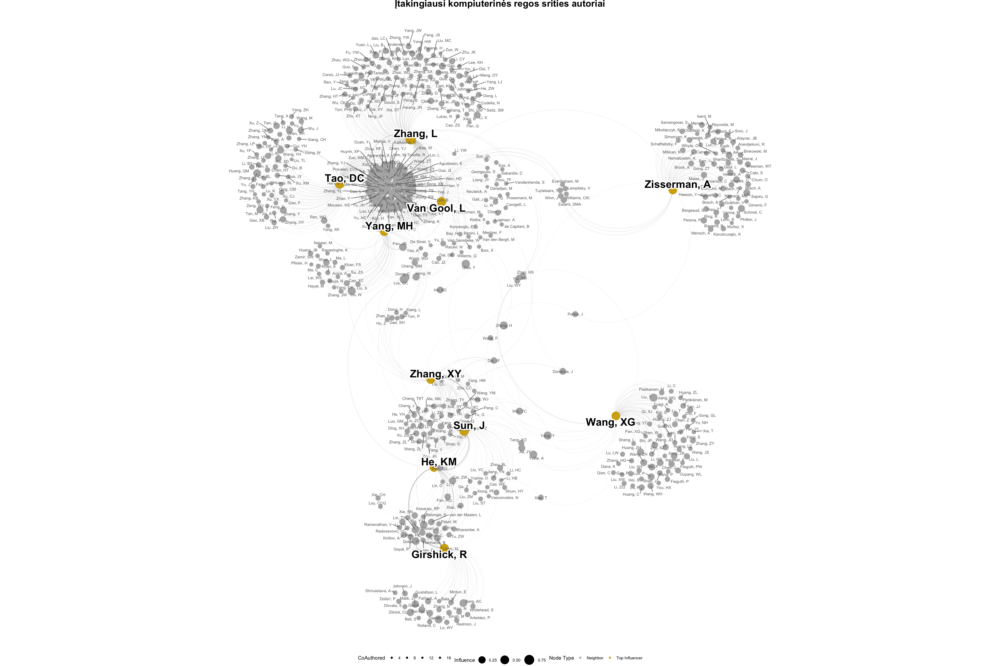

In [48]:
my_path <- "./dataset/generated/topic_1_adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi kompiuterinės regos srities autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

10 įtakingiausių natūralios kalbos apdorojimo (angl. NLP - Natural Language Processing) autorių

Įtakingiausi autoriai

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Liu, Y",0.856,137,0.0487,0.0046,51585
2,"Narang, S",0.647,160,0.0258,0.0027,12514
3,"Wang, Y",0.628,108,0.0407,0.0025,20141
4,"Elsen, E",0.513,108,0.0311,0.0015,2858
5,"Le, Q",0.482,70,0.0245,0.0033,36427
6,"Zhang, Y",0.481,58,0.0224,0.0041,31472
7,"Wang, XZ",0.478,115,0.0173,0.0024,9835
8,"Shazeer, N",0.458,82,0.0050,0.0049,104699
9,"Bengio, Y",0.405,30,0.0122,0.0051,91403
10,"Lee, K",0.403,89,0.0037,0.0038,67649


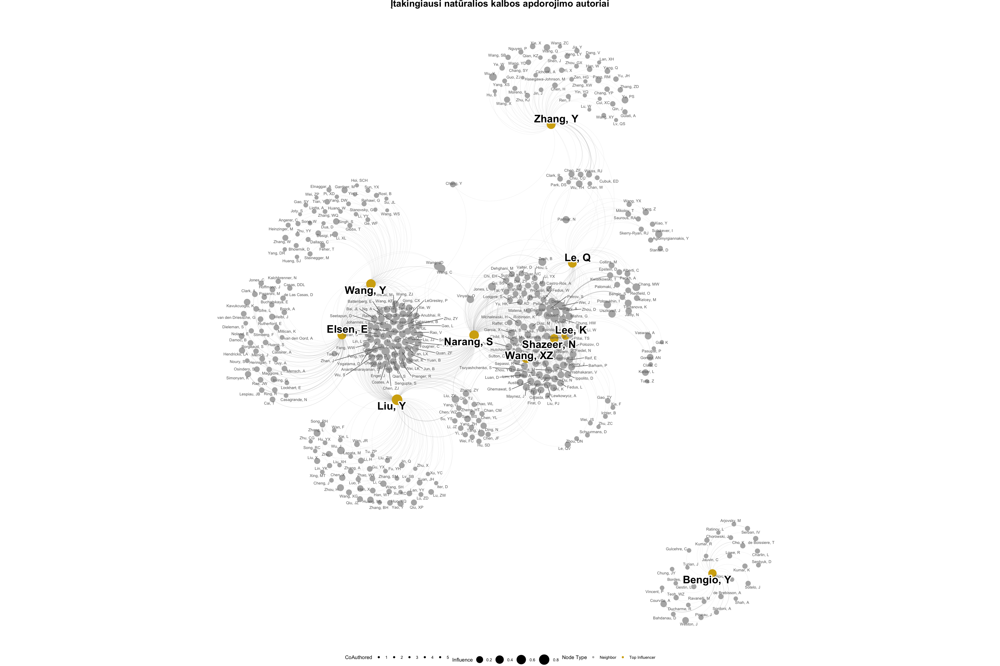

In [57]:
my_path <- "./dataset/generated/topic_2_adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi natūralios kalbos apdorojimo autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

10 įtakingiausių viso dirbtinio intelekto lauko autorių

Įtakingiausi autoriai

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Zhang, L",0.919,520,0.0229,0.0017,89317
2,"Liu, Y",0.916,513,0.0250,0.0015,51585
3,"Zhang, Y",0.721,399,0.0205,0.0012,31472
4,"Tao, DC",0.700,467,0.0157,0.0011,35083
5,"Yang, MH",0.681,498,0.0108,0.0013,59759
6,"Li, Y",0.666,434,0.0144,0.0012,40479
7,"Matas, J",0.656,493,0.0130,0.0010,26968
8,"Van Gool, L",0.524,319,0.0101,0.0011,68993
9,"Li, H",0.512,289,0.0136,0.0009,34384
10,"Li, X",0.488,363,0.0091,0.0008,22229


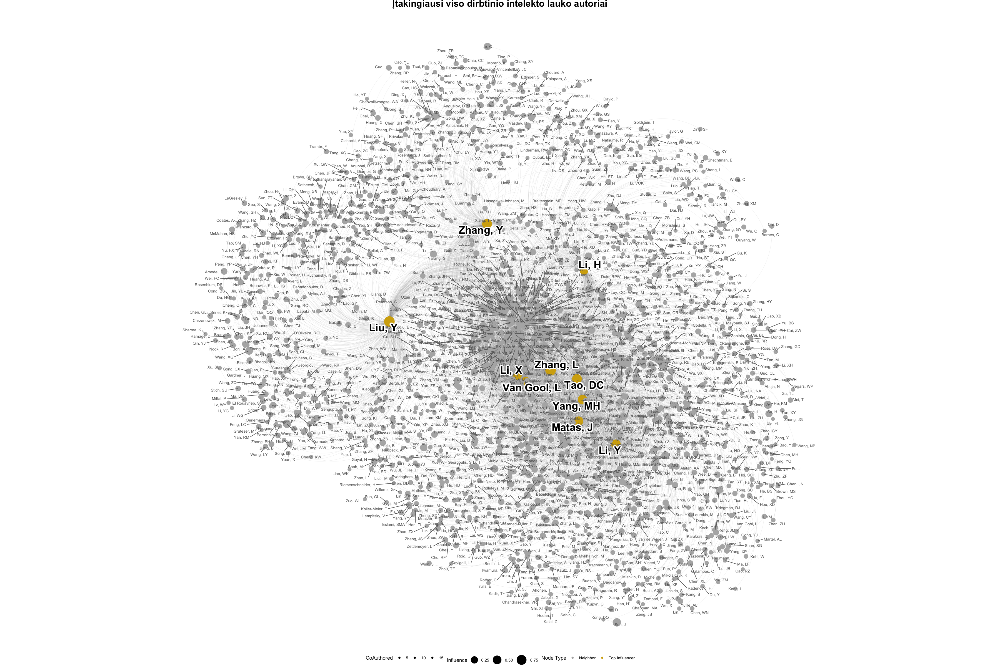

In [50]:
my_path <- "./dataset/generated/adjacency.csv"
final_plot <- visualize_influencers(my_path, top_k = 10, title='Įtakingiausi viso dirbtinio intelekto lauko autoriai')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

## Įtakingiausios autorių grupės pagal tyrimo sritis / temas

In [51]:
suppressPackageStartupMessages({
  library(igraph)
  library(ggraph)
  library(ggplot2)
  library(tibble)
  library(dplyr)
  library(patchwork)
  library(RColorBrewer)
})

visualize_most_influential_community <- function(file_path, citation_path = "./dataset/generated/author_citations.csv", top_k = 3, label_limit = 150, title = '') {
  
  # --- STABILUMAS: Nustatomas "Seed" ---
  set.seed(42) 
  
  # --- 1. Duomenų nuskaitymas ---
  if (!file.exists(file_path)) {
    stop("Nurodytas failo kelias neegzistuoja.")
  }
  
  df_raw <- read.csv(file_path, check.names = FALSE)
  
  # --- 2. Grafo kūrimas ---
  g <- graph_from_data_frame(df_raw, directed = FALSE)
  
  g <- simplify(
    g,
    remove.multiple = TRUE,
    remove.loops    = TRUE,
    edge.attr.comb  = "first"
  )
  
  # --- Pašaliname 0 laipsnio (izoliuotus) mazgus ---
  g <- delete_vertices(g, V(g)[degree(g) == 0])
  if (vcount(g) == 0) stop("Grafas yra tuščias pašalinus 0 laipsnio mazgus.")

  # --- 1b. Citavimo duomenų nuskaitymas ---
  citations_vec <- NULL
  if (file.exists(citation_path)) {
    df_cit <- read.csv(citation_path, check.names = FALSE, stringsAsFactors = FALSE)
    colnames(df_cit)[1:2] <- c("Author", "Citations")
    df_cit <- df_cit %>% 
      group_by(Author) %>% 
      summarize(Citations = max(Citations), .groups = 'drop')
    citations_vec <- setNames(df_cit$Citations, df_cit$Author)
  } else {
    warning(paste("Citavimo failas nerastas:", citation_path, "- Citavimų skaičius nustatytas į 0."))
  }
  
  # Priskiriame citavimus
  if (!is.null(citations_vec)) {
    V(g)$citations <- citations_vec[V(g)$name]
    V(g)$citations[is.na(V(g)$citations)] <- 0
  } else {
    V(g)$citations <- 0
  }
  
  # --- 3. Mazgų metrikos ---
  V(g)$degree      <- degree(g)
  V(g)$betweenness <- betweenness(g, directed = FALSE, normalized = TRUE)
  pr_weights       <- V(g)$citations + 1 
  V(g)$pagerank    <- page_rank(g, directed = FALSE, personalized = pr_weights, weights=NULL)$vector
  
  # --- Bendruomenių aptikimas ---
  try({
    V(g)$community <- cluster_louvain(g, weights = NULL)$membership
  }, silent = TRUE)
  if (is.null(V(g)$community)) V(g)$community <- 1 
  
  V(g)$label <- V(g)$name
  
  # --- Bendras balas (Composite Score) ---
  normalize <- function(x) {
    if (max(x) == min(x)) return(rep(0, length(x))) 
    return ((x - min(x)) / (max(x) - min(x)))
  }
  
  score_deg  <- normalize(V(g)$degree)
  score_bet  <- normalize(V(g)$betweenness)
  score_pr   <- normalize(V(g)$pagerank)
  
  V(g)$influence_score <- (score_deg + score_bet + score_pr) / 3
  
  # =========================================================
  # RANDAME ĮTAKINGIAUSIĄ BENDRUOMENĘ
  # =========================================================
  
  comm_data <- data.frame(
    id = V(g)$community,
    score = V(g)$influence_score
  )
  
  comm_stats <- comm_data %>%
    group_by(id) %>%
    summarize(
      total_influence = sum(score),
      member_count = n()
    ) %>%
    arrange(desc(total_influence))
  
  best_comm_id <- comm_stats$id[1]
  
  # Sukuriame TIK šios bendruomenės pografį
  g_sub <- induced_subgraph(g, V(g)$community == best_comm_id)
  
  # =========================================================
  
  # --- Perskaičiuojame Top K šioje bendruomenėje ---
  valid_top_k <- min(top_k, vcount(g_sub)) 
  # Gauname pografio indeksus
  top_ix_sub <- order(V(g_sub)$influence_score, decreasing = TRUE)[1:valid_top_k]
  
  # Pažymime Top mazgus
  V(g_sub)$is_top <- FALSE
  V(g_sub)$is_top[top_ix_sub] <- TRUE
  
  # --- SPAUSDINTI LENTELĘ (Konsolės išvestis) ---
  top_df <- data.frame(
    Index          = 1:valid_top_k,
    Name           = V(g_sub)$name[top_ix_sub],
    InfluenceScore = round(V(g_sub)$influence_score[top_ix_sub], 3),
    Degree         = V(g_sub)$degree[top_ix_sub],
    Betweenness    = round(V(g_sub)$betweenness[top_ix_sub], 4),
    PageRank       = round(V(g_sub)$pagerank[top_ix_sub], 4),
    Citations      = V(g_sub)$citations[top_ix_sub]
  )

  # Tikriname, ar prieinama IRdisplay (standartas Jupyter R branduolyje)
  if (requireNamespace("IRdisplay", quietly = TRUE)) {
    # Generuojame HTML lentelę su pavadinimu
    header_html <- paste0("<h3>Įtakingiausi autoriai bendruomenėje ", best_comm_id, " (įtakos metrika: ", round(comm_stats$total_influence[1], 2) , ", autorių kiekis: ", comm_stats$member_count[1], ") </h3>")
    IRdisplay::display_html(header_html)
    
    # PATAISYMAS: Konvertuojame kable objektą į simbolių eilutę
    IRdisplay::display_html(as.character(knitr::kable(top_df, format = "html", align = "c")))
    
  } else {
    print(top_df)
  }

  # --- Etikečių filtravimas (Ribojame ne "top" etiketes, kad neapkrautume vaizdo) ---
  # Visada žymime Top K. Ribojame tik 'pilkus' mazgus.
  all_ix <- order(V(g_sub)$influence_score, decreasing = TRUE)
  
  # Pagalbinis kodas nuspręsti, kas gauna etiketę
  V(g_sub)$should_label <- FALSE
  # Visada žymėti top k
  V(g_sub)$should_label[top_ix_sub] <- TRUE
  # Žymėti kitus iki limito
  remaining_limit <- max(0, label_limit - valid_top_k)
  if (remaining_limit > 0) {
      non_top_ix <- setdiff(all_ix, top_ix_sub)
      # Atrinkti kitus įtakingiausius žmones limitui užpildyti
      if(length(non_top_ix) > 0) {
        picked_others <- non_top_ix[1:min(length(non_top_ix), remaining_limit)]
        V(g_sub)$should_label[picked_others] <- TRUE
      }
  }

  # --- Išdėstymas (Layout) ---
  coords <- layout_with_fr(g_sub)
  layout_tbl <- create_layout(g_sub, layout = "manual", x = coords[, 1], y = coords[, 2])
  
  # --- Braižymas (Taikant Auksinį/Pilką stilių) ---
  p <- ggraph(layout_tbl) +
    
    # Briaunos
    geom_edge_arc(
      aes(width = CoAuthored, alpha = CoAuthored),
      edge_colour = "grey60", strength = 0.9, show.legend = FALSE
    ) +
    
    # Mazgai (Pagal is_top)
    geom_node_point(
      aes(size = influence_score, color = factor(is_top)),
      show.legend = TRUE 
    ) +
    
    # Etiketės - "Įprasti" bendruomenės nariai (Pilki, maži)
    geom_node_text(
      aes(label = label, size = influence_score, filter = should_label & !is_top), 
      color = "grey40", 
      repel = TRUE, 
      bg.color = "white", 
      bg.r = 0.1,
      max.overlaps = Inf
    ) +
    
    # Etiketės - "Top" influenceriai (Juodi, ryškūs, dideli)
    geom_node_text(
      aes(label = label, filter = is_top),
      color = "black",        
      size = 8,               
      fontface = "bold",
      repel = TRUE,
      bg.color = "white",
      bg.r = 0.15,
      max.overlaps = Inf
    ) +
    
    # Skalės
    scale_edge_width_continuous(range = c(0.2, 0.8)) +
    scale_edge_alpha_continuous(range = c(0.3, 0.6)) +
    
    # Dydžio skalė valdo taškus
    scale_size_continuous(range = c(3, 10), guide = "none") + 
    
    # Spalvų skalė valdo Auksinę vs Pilką
    scale_color_manual(
      name   = "Node Type",
      values = c("FALSE" = "grey70", "TRUE" = "#D4AC0D"),
      labels = c("FALSE" = "Bendruomenės narys", "TRUE"  = "Top influenceris")
    ) +
    
    coord_equal() +
    theme_void() + 
    theme(
      plot.title = element_text(size = 25, hjust = 0.5, face = "bold", margin = margin(b = 20)),
      legend.position = "bottom"
    ) +
    ggtitle(title)
  
  return(p)
}

Įtakingiausia kompiuterinės regos autorių grupė (bendruomenė)

Įtakingiausi autoriai bendruomenėje 3 (įtakos metrika: 21.52, autorių kiekis: 208)

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Zhang, L",0.906,172,0.0322,0.0029,89317
2,"Tao, DC",0.727,130,0.0321,0.0018,35083
3,"Van Gool, L",0.602,119,0.0203,0.0020,68993
4,"Yang, MH",0.474,108,0.0127,0.0016,59759
5,"Loy, CC",0.453,112,0.0103,0.0016,35134
6,"Qiao, Y",0.423,115,0.0093,0.0013,20824
7,"Zuo, WM",0.393,105,0.0079,0.0013,34289
8,"Zhao, Y",0.381,99,0.0102,0.0010,11431
9,"Huang, TS",0.371,95,0.0089,0.0012,22915
10,"Wang, ZY",0.354,99,0.0073,0.0011,17239


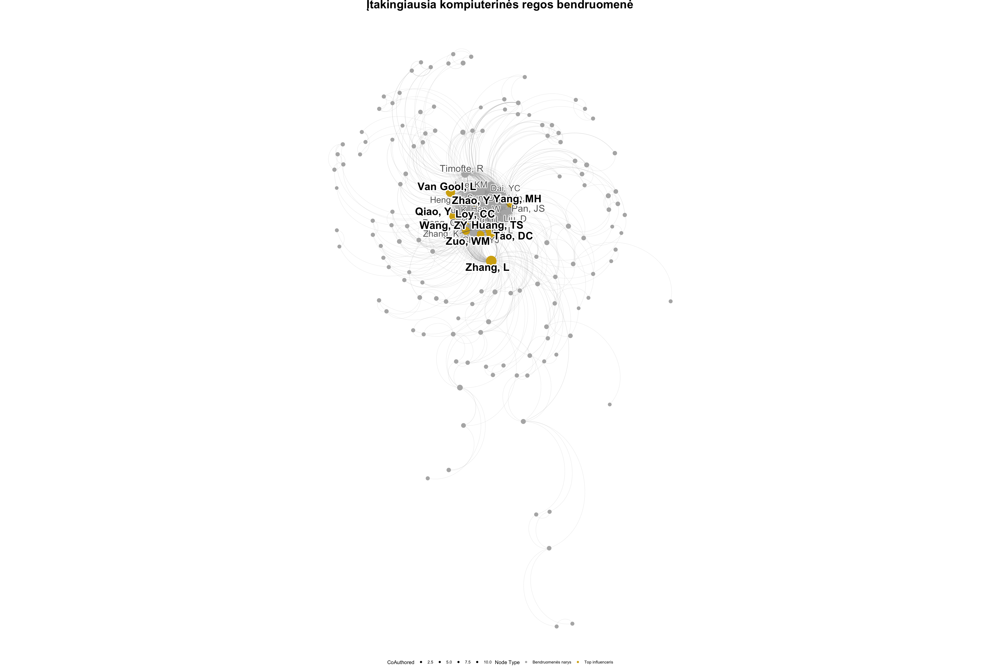

In [52]:
my_path <- "./dataset/generated/topic_1_adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia kompiuterinės regos bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

Įtakingiausia natūralios kalbos apdorojimo autorių grupė (bendruomenė)

Įtakingiausi autoriai bendruomenėje 4 (įtakos metrika: 18.71, autorių kiekis: 104)

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Narang, S",0.647,160,0.0258,0.0027,12514
2,"Le, Q",0.482,70,0.0245,0.0033,36427
3,"Wang, XZ",0.478,115,0.0173,0.0024,9835
4,"Shazeer, N",0.458,82,0.0050,0.0049,104699
5,"Lee, K",0.403,89,0.0037,0.0038,67649
6,"Devlin, J",0.396,100,0.0027,0.0033,52415
7,"Child, R",0.373,96,0.0042,0.0028,18117
8,"Petrov, S",0.352,100,0.0027,0.0025,2783
9,"Roberts, A",0.345,98,0.0058,0.0020,11889
10,"Zoph, B",0.320,92,0.0042,0.0020,18559


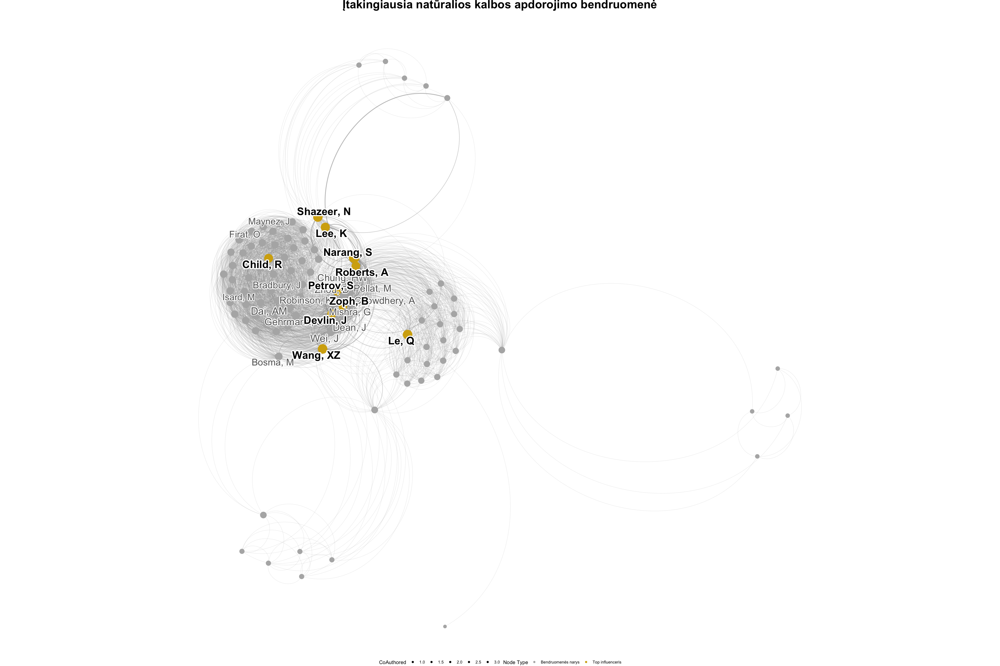

In [56]:
my_path <- "./dataset/generated/topic_2_adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia natūralios kalbos apdorojimo bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

Įtakingiausia autorių grupė (bendruomenė) visame dirbtinio intelekto lauke

Įtakingiausi autoriai bendruomenėje 5 (įtakos metrika: 47.27, autorių kiekis: 446)

Index,Name,InfluenceScore,Degree,Betweenness,PageRank,Citations
1,"Yang, MH",0.681,498,0.0108,0.0013,59759
2,"Li, Y",0.666,434,0.0144,0.0012,40479
3,"Matas, J",0.656,493,0.0130,0.0010,26968
4,"Leonardis, A",0.447,445,0.0035,0.0007,5581
5,"Khan, FS",0.442,451,0.0022,0.0007,19256
6,"Torr, PHS",0.437,381,0.0050,0.0008,29326
7,"Danelljan, M",0.428,444,0.0017,0.0007,19393
8,"Hu, WM",0.428,438,0.0022,0.0007,10440
9,"Wu, Y",0.422,265,0.0094,0.0008,25792
10,"Zhang, Z",0.420,331,0.0049,0.0009,38083


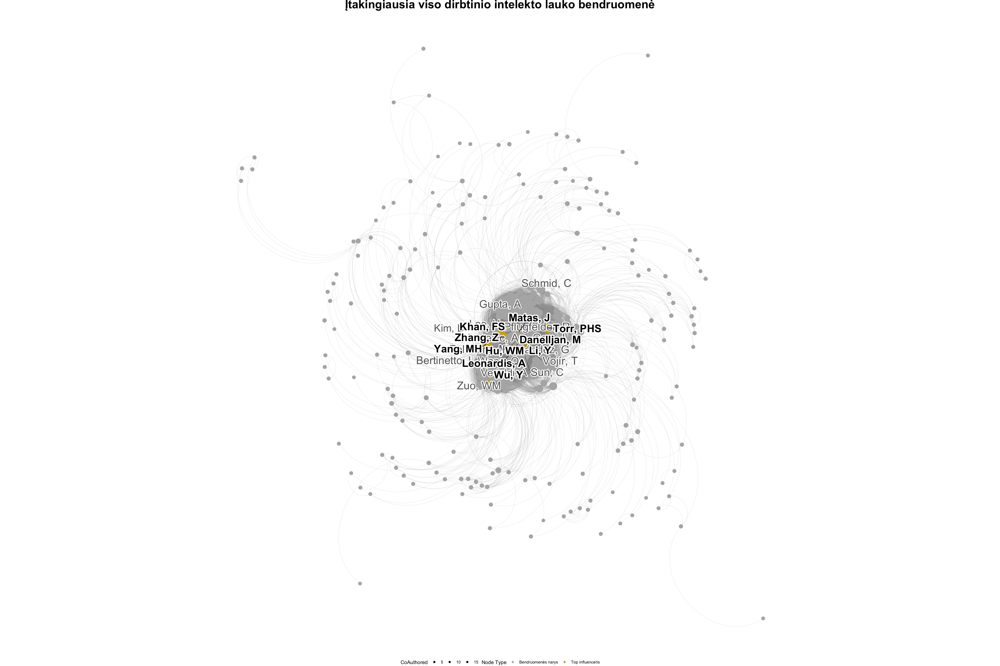

In [54]:
my_path <- "./dataset/generated/adjacency.csv"
final_plot <- visualize_most_influential_community(my_path, top_k = 10, label_limit=25, title='Įtakingiausia viso dirbtinio intelekto lauko bendruomenė')

options(repr.plot.width = 30, repr.plot.height = 20)
print(final_plot)

# Išvados

- Atlikta klasterizavimo analizė parodė, kad kompiuterinė rega (angl. Computer Vision) yra neginčijamai pati įtakingiausia ir didžiausia tyrimų sritis nagrinėjamame duomenų rinkinyje, generuojanti beveik 4 milijonus citavimų. Antroji pagal svarbą sritis yra natūralios kalbos apdorojimas (angl. Neural Sequence Modeling in NLP), surinkusi virš 800 tūkstančių citavimų. Šios dvi sritys sudaro dirbtinio intelekto mokslinių tyrimų branduolį.
- Kompiuterinėje regoje pagal kompleksinį įtakos balą (angl. Influence Score) lyderiauja L. Zhang (0.906), pasižymintis itin dideliu bendradarbiavimo tinklu (172 ryšiai). Nustatyta, kad vien citavimų skaičius negarantuoja didžiausios įtakos tinkle – pavyzdžiui, K. M. He turi daugiausiai citavimų (virš 336 tūkst.), tačiau dėl mažesnio tarpininkavimo ir ryšių skaičiaus, bendrame  eitinge užima 8-ąją vietą. Įtakingiausia šios srities tyrėjų grupė vienija 208 mokslininkus.
- Natūralios kalbos apdorojimo (NLP) srityje ryškiausias lyderis yra Y. Liu (0.856), gerokai lenkiantis kitus tyrėjus tiek pagal įtakos balą, tiek pagal tarpininkavimo rodiklius. Įdomu tai, kad vieni žinomiausių šios srities mokslininkų (pvz., Y. Bengio) šiame specifiniame tinkle užima žemesnes pozicijas pagal įtakos balą, nors turi labai aukštus citavimo rodiklius. Įtakingiausia NLP b bendruomenė yra mažesnė nei kompiuterinės regos ir jungia 104 autorius.
- Vertinant visą dirbtinio intelekto lauką, pastebima tendencija, kad lyderiaujančios pozicijos sutampa su kompiuterinės regos ir NLP lyderiais (L. Zhang ir Y. Liu išlaiko 1-ą ir 2-ą vietas bendrame reitinge). Tai rodo šių tyrėjų universalumą arba minėtų sričių dominavimą visame DI mokslo lauke. Didžiausia ir įtakingiausia identifikuota mokslininkų bendruomenė (klasteris) jungia 446 autorius, kas rodo glaudų ir platų bendradarbiavimo tinklą tarp pagrindinių srities veikėjų.